### Библиотеки

In [5]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from sklearn.preprocessing import MinMaxScaler

from tqdm import tqdm

### Описание колонок

Датасет содержит по 53 столбца на строку, столбцы содержат следующие данные:

    1 временная метка (с)
    2-18 данные с датчиков на руке
    19-35 данные с датчиков на груди
    36-52 данные с датчиков на лодыжке
    52 id субъекта

Сенсорные данные IMU содержат следующие столбцы:

    1 температура (°C)
    2-4 Данные 3D-ускорения (мс-2), масштаб: ±16g, разрешение: 13 бит
    5-7 Данные 3D-ускорения (мс-2), масштаб: ±6g, разрешение: 13 бит*
    8-10 данных 3D-гироскопа (рад/с)
    11-13 Данные 3D-магнитометра (мкТл)
    14-17 Ориентация (недопустимо при данном сборе данных) 

Список видов активности и соответствующих действий:

    1 лежа
    2 сидя
    3 стоя
    4 ходьба
    5 бег
    6 езда на велосипеде
    7 Скандинавская ходьба
    8 просмотр телевизора
    9 работа за компьютером
    10 вождение автомобиля
    11 подъем по лестнице
    12 спуск по лестнице
    13 уборка пылесосом
    14 глажка одежды 
    15 складывание белья
    16 уборка дома
    17 игра в футбол
    18 прыжки со скакалкой
    0 прочие (временные занятия)

### Считывание данных

In [9]:
df = pd.read_csv("Physical_Activity_Monitoring_unlabeled.csv")

## Знакомство с данными

### Первый взгляд

In [4]:
# Нахождение полностью одинаковых строк
duplicates = df[df.duplicated(keep="first") & ~df.duplicated()]
duplicates

,timestamp,handTemperature,handAcc16_1,handAcc16_2,handAcc16_3,handAcc6_1,handAcc6_2,handAcc6_3,handGyro1,handGyro2,...,ankleGyro2,ankleGyro3,ankleMagne1,ankleMagne2,ankleMagne3,ankleOrientation1,ankleOrientation2,ankleOrientation3,ankleOrientation4,subject_id


In [5]:
print(f"df - {df.shape}, null - {df.isna().sum().sum()}")

df - (534601, 53), null - 125732


In [6]:
df.columns

Index(['timestamp', 'handTemperature', 'handAcc16_1', 'handAcc16_2',
       'handAcc16_3', 'handAcc6_1', 'handAcc6_2', 'handAcc6_3', 'handGyro1',
       'handGyro2', 'handGyro3', 'handMagne1', 'handMagne2', 'handMagne3',
       'handOrientation1', 'handOrientation2', 'handOrientation3',
       'handOrientation4', 'chestTemperature', 'chestAcc16_1', 'chestAcc16_2',
       'chestAcc16_3', 'chestAcc6_1', 'chestAcc6_2', 'chestAcc6_3',
       'chestGyro1', 'chestGyro2', 'chestGyro3', 'chestMagne1', 'chestMagne2',
       'chestMagne3', 'chestOrientation1', 'chestOrientation2',
       'chestOrientation3', 'chestOrientation4', 'ankleTemperature',
       'ankleAcc16_1', 'ankleAcc16_2', 'ankleAcc16_3', 'ankleAcc6_1',
       'ankleAcc6_2', 'ankleAcc6_3', 'ankleGyro1', 'ankleGyro2', 'ankleGyro3',
       'ankleMagne1', 'ankleMagne2', 'ankleMagne3', 'ankleOrientation1',
       'ankleOrientation2', 'ankleOrientation3', 'ankleOrientation4',
       'subject_id'],
      dtype='object')

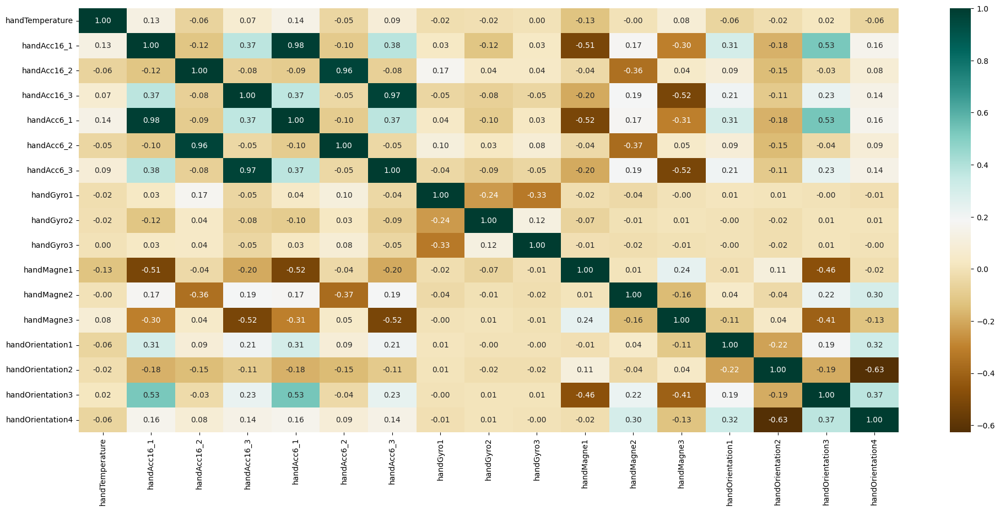

In [15]:
df_corr = df[
    [
        "handTemperature",
        "handAcc16_1",
        "handAcc16_2",
        "handAcc16_3",
        "handAcc6_1",
        "handAcc6_2",
        "handAcc6_3",
        "handGyro1",
        "handGyro2",
        "handGyro3",
        "handMagne1",
        "handMagne2",
        "handMagne3",
        "handOrientation1",
        "handOrientation2",
        "handOrientation3",
        "handOrientation4",
    ]
].corr()

f, ax = plt.subplots(figsize=(24, 10))
sns.heatmap(
    df_corr,
    mask=np.zeros_like(df_corr),
    cmap="BrBG",
    ax=ax,
    annot=True,
    fmt=".2f",
)
plt.show()

### Удаление дублирующейся информации

In [10]:
# Удаление повторяющихся данных
df.drop(
    columns=[
        "handAcc6_1",
        "handAcc6_2",
        "handAcc6_3",
        "chestAcc6_1",
        "chestAcc6_2",
        "chestAcc6_3",
        "ankleAcc6_1",
        "ankleAcc6_2",
        "ankleAcc6_3",
    ],
    inplace=True,
)

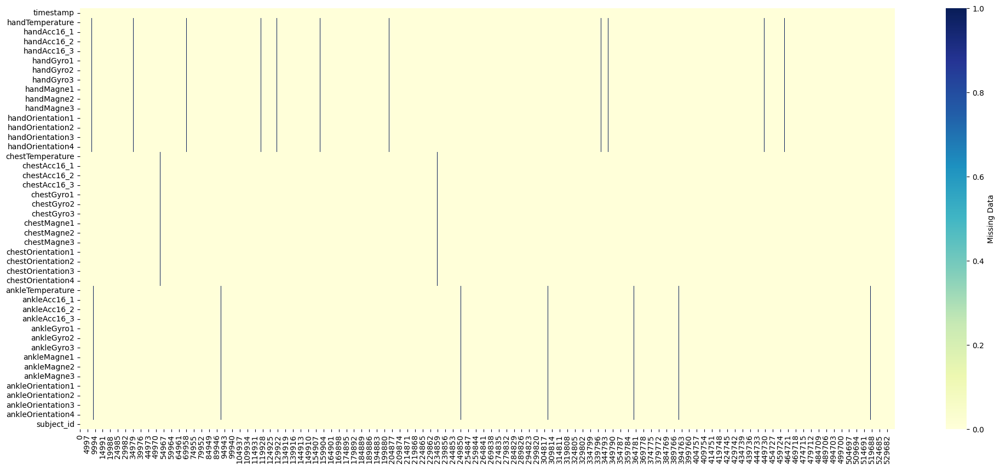

In [18]:
plt.figure(figsize=(24, 10))
sns.heatmap(df.isna().transpose(), cmap="YlGnBu", cbar_kws={"label": "Missing Data"})
plt.savefig("visualizing_missing_data_with_heatmap_Seaborn_Python.png", dpi=100)

### Разделение на 8 объектов

In [33]:
df["subject_id"].value_counts()

subject_id
5    76793
8    73047
6    70240
1    69882
2    68740
4    63740
7    62115
3    50044
Name: count, dtype: int64

In [34]:
subjects = []
for i in sorted(df["subject_id"].unique()):
    d = df.loc[df["subject_id"] == i].sort_values(by="timestamp")
    d.index = d.timestamp
    d.drop(columns="subject_id", inplace=True)
    subjects.append(d)

### Вывод показаний датчиков для всех пользователя

In [35]:
data_hand = [
    "handTemperature",
    "handAcc16_1",
    "handAcc16_2",
    "handAcc16_3",
    "handGyro1",
    "handGyro2",
    "handGyro3",
    "handMagne1",
    "handMagne2",
    "handMagne3",
    "handOrientation1",
    "handOrientation2",
    "handOrientation3",
    "handOrientation4",
]
data_chest = [
    "chestTemperature",
    "chestAcc16_1",
    "chestAcc16_2",
    "chestAcc16_3",
    "chestGyro1",
    "chestGyro2",
    "chestGyro3",
    "chestMagne1",
    "chestMagne2",
    "chestMagne3",
    "chestOrientation1",
    "chestOrientation2",
    "chestOrientation3",
    "chestOrientation4",
]
data_ankle = [
    "ankleTemperature",
    "ankleAcc16_1",
    "ankleAcc16_2",
    "ankleAcc16_3",
    "ankleGyro1",
    "ankleGyro2",
    "ankleGyro3",
    "ankleMagne1",
    "ankleMagne2",
    "ankleMagne3",
    "ankleOrientation1",
    "ankleOrientation2",
    "ankleOrientation3",
    "ankleOrientation4",
]

data_lists = [data_hand, data_chest, data_ankle]
titles = ["Hand", "Chest", "Ankle"]

Subject 1


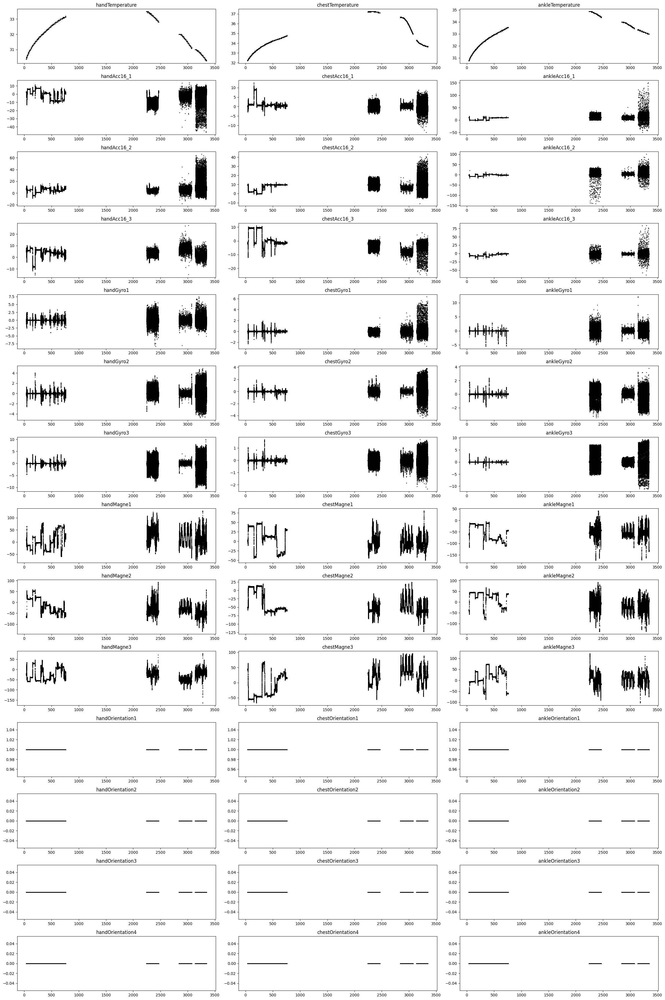

Subject 2


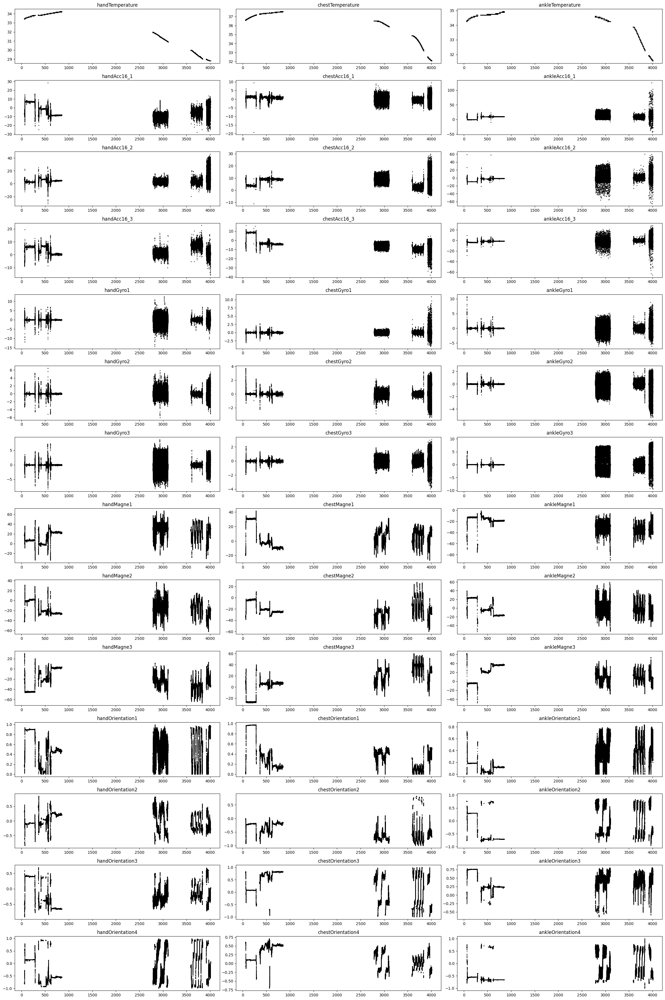

Subject 3


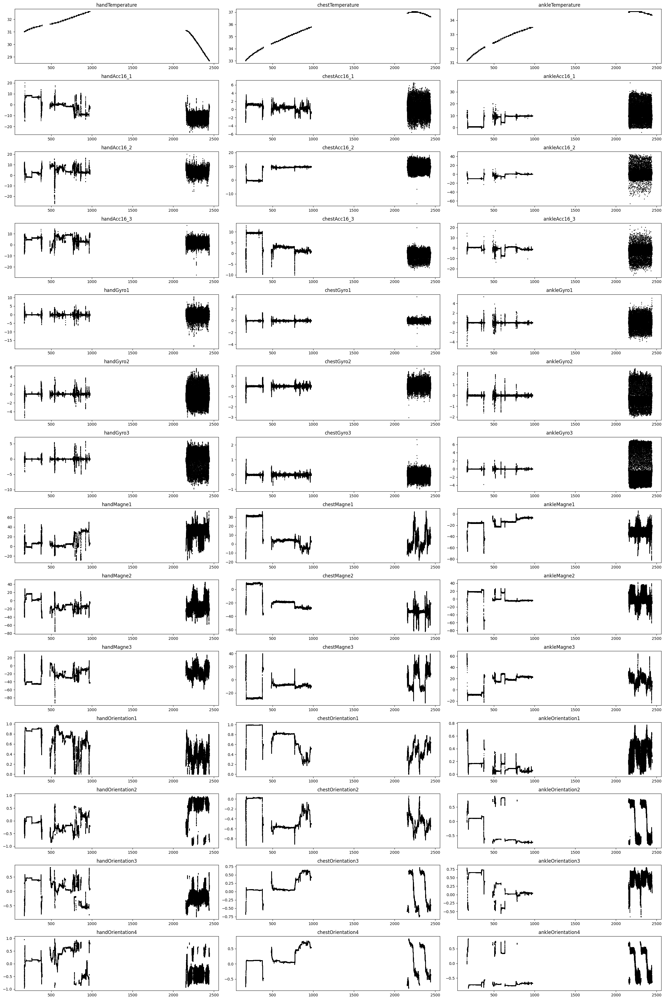

Subject 4


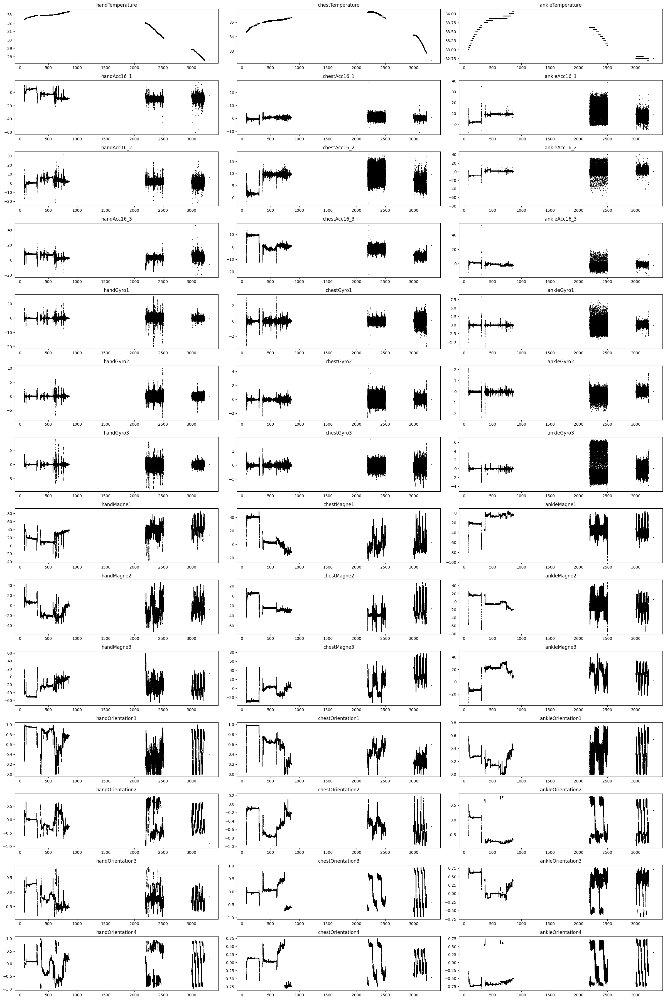

Subject 5


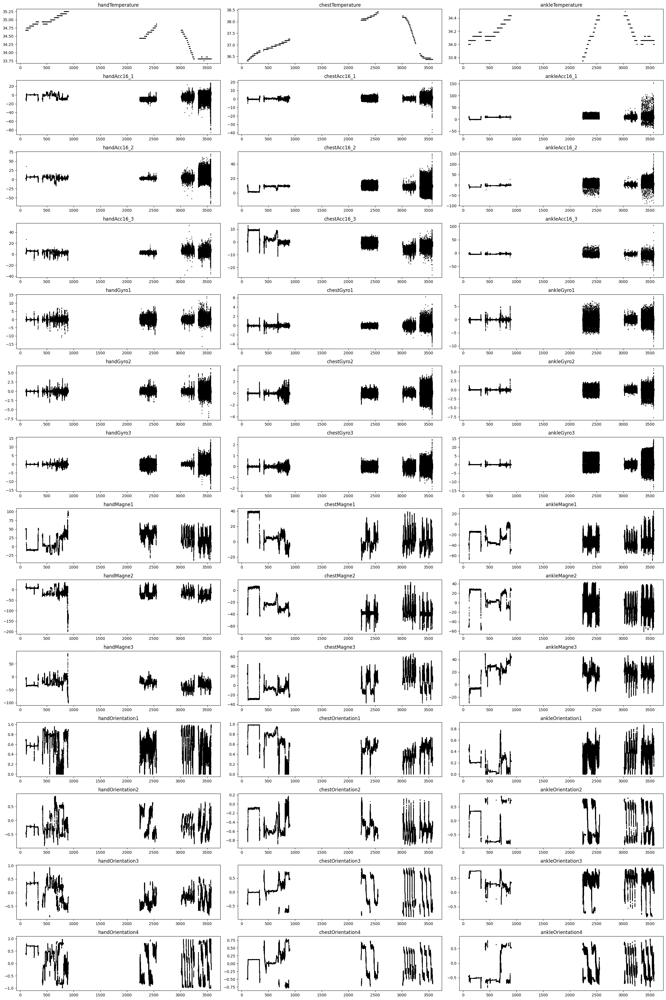

Subject 6


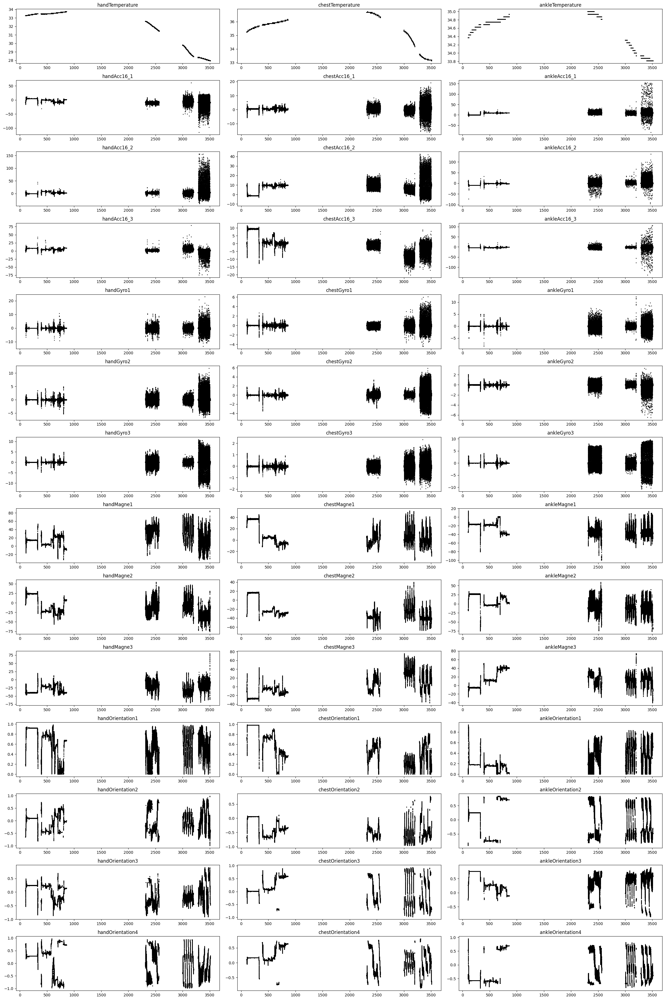

Subject 7


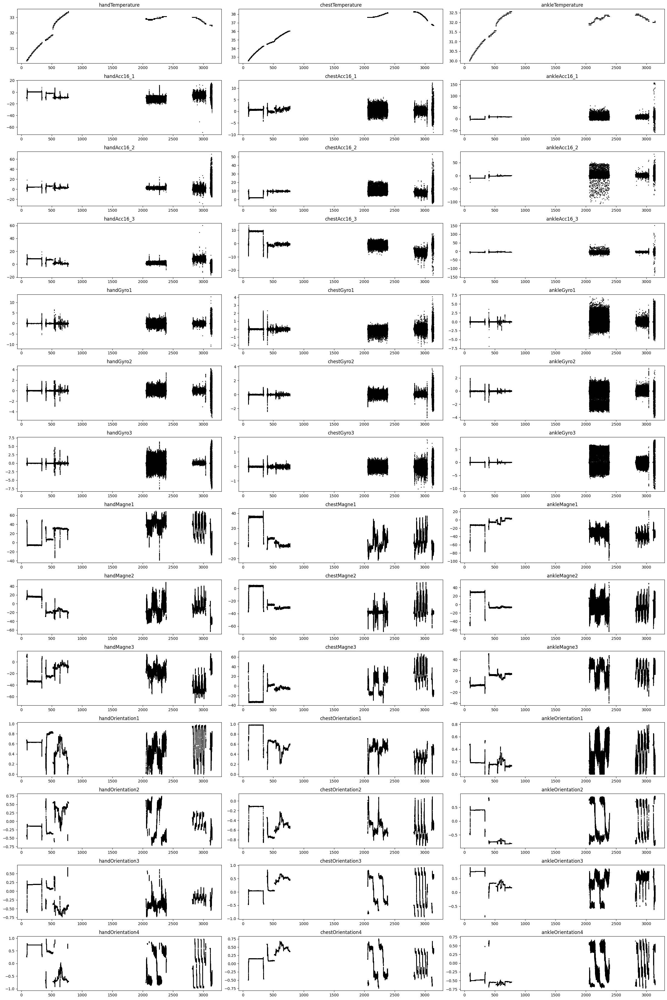

Subject 8


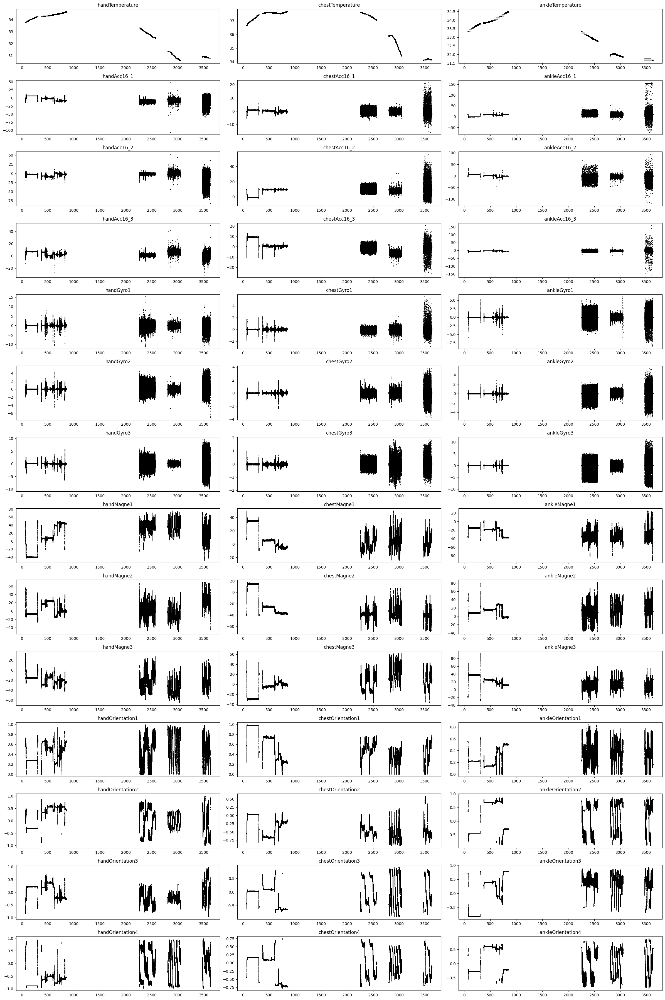

In [59]:
for k in range(len(subjects)):
    print('Subject', k+1)
    fig, axes = plt.subplots(len(data_hand), 3, figsize=(24, len(data_lists) * 12))

    for i, data_list in enumerate(data_lists):
        for j, sensor in enumerate(data_list):
            axes[j, i].scatter(
                subjects[k][sensor].index,
                subjects[k][sensor],
                c="black",
                s=1,
            )
            axes[j, i].set_title(f"{sensor}")

    plt.tight_layout()
    plt.show()

### Вывод скорости изменения показаний

Subject 1


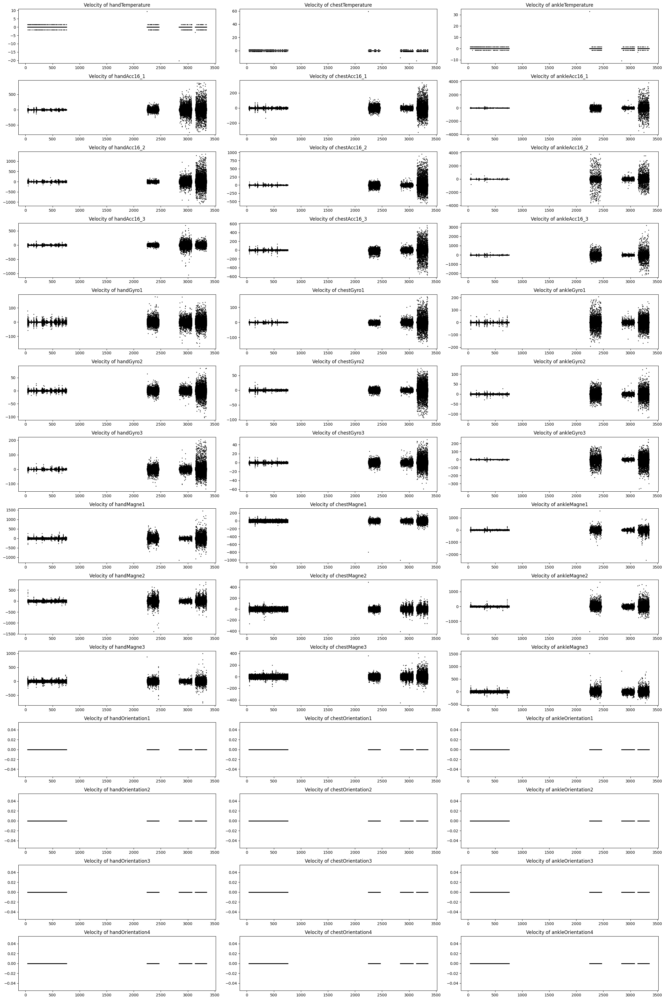

Subject 2


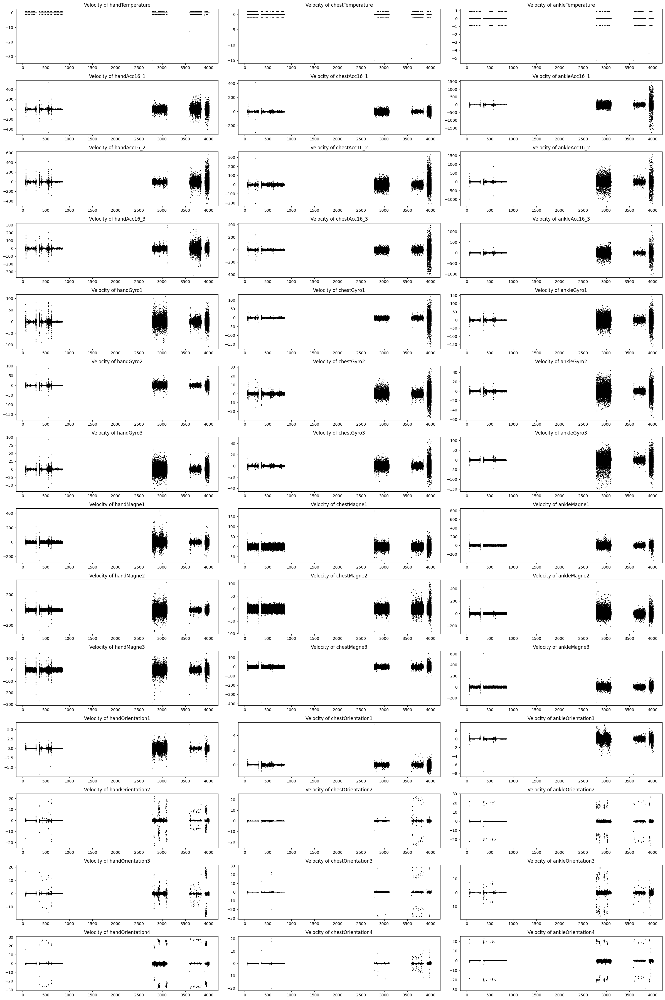

Subject 3


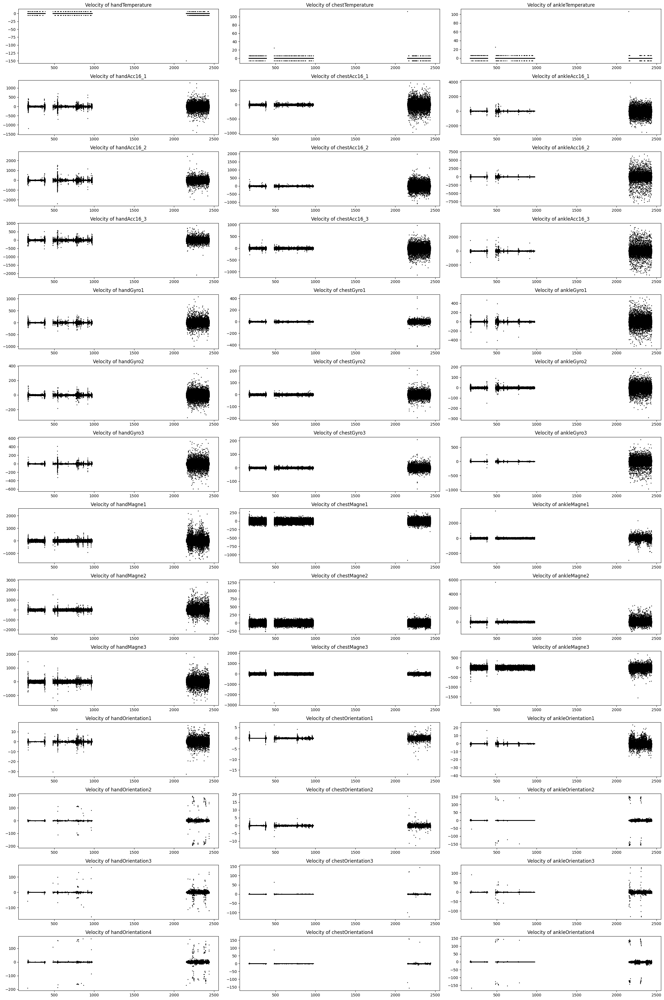

Subject 4


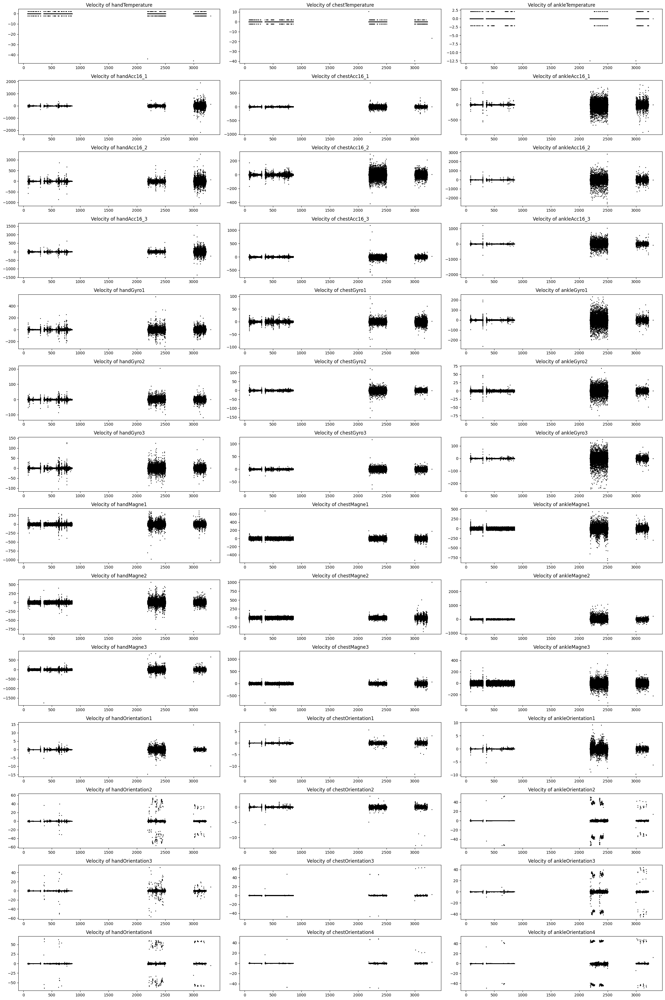

Subject 5


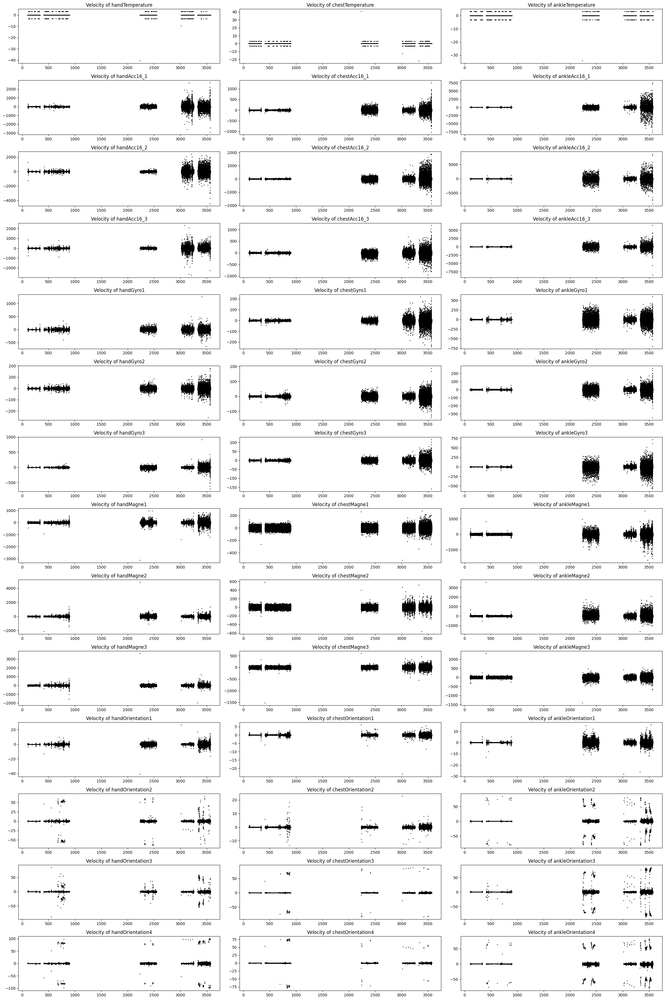

Subject 6


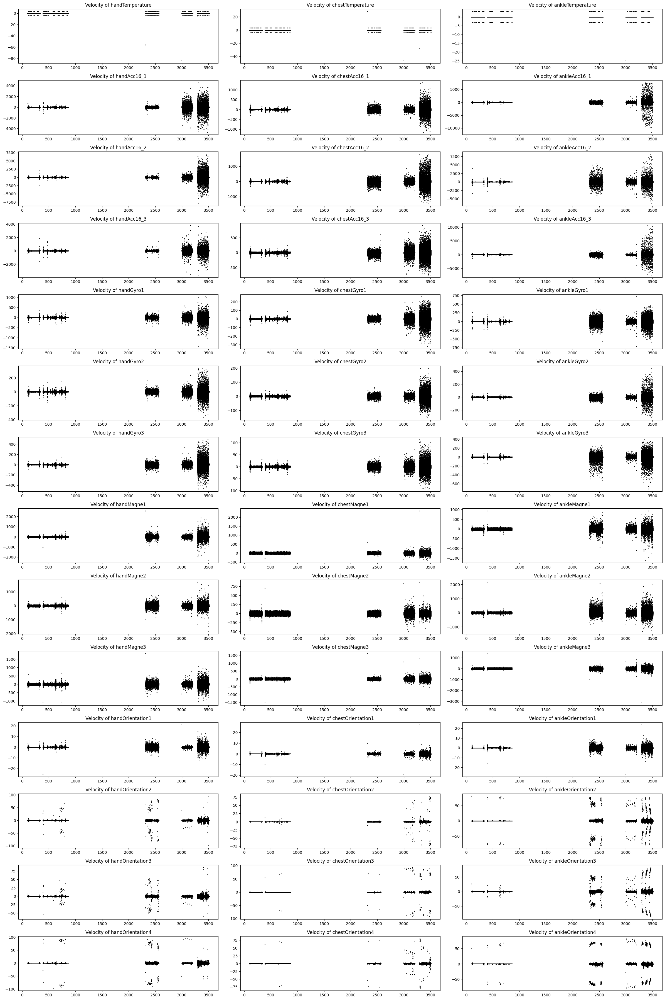

Subject 7


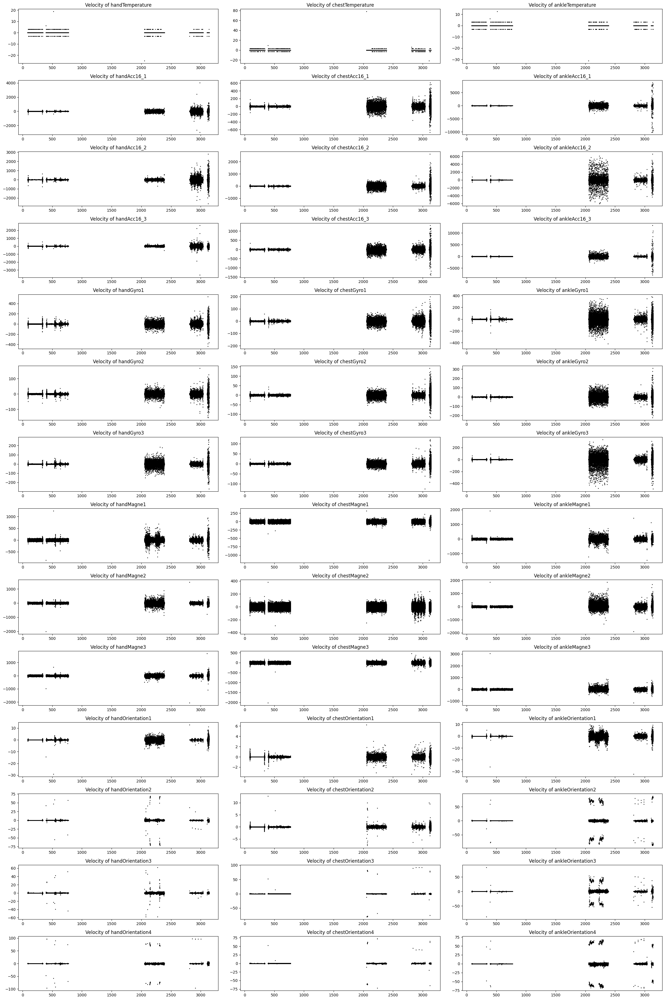

Subject 8


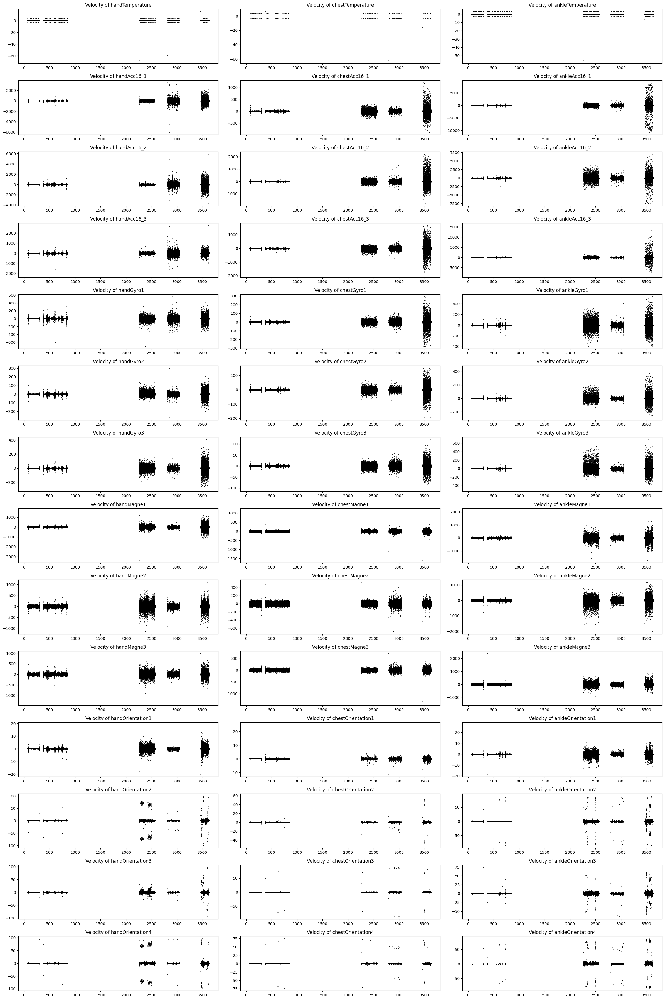

In [37]:
for k in range(len(subjects)):
    print("Subject", k + 1)
    fig, axes = plt.subplots(len(data_hand), 3, figsize=(24, len(data_lists) * 12))

    for i, data_list in enumerate(data_lists):
        for j, sensor in enumerate(data_list):
            # Вычисление разницы между последовательными значениями
            differences = np.diff(subjects[k][sensor])
            # Вычисление разницы во времени между измерениями (предположим, что временные шаги постоянны)
            time_diff = subjects[k][sensor].index[1] - subjects[k][sensor].index[0]
            # Вычисление скорости изменения (производной)
            velocities = differences / time_diff

            axes[j, i].scatter(
                subjects[k][sensor].index[
                    1:
                ],  # Используем индексы начиная со второго элемента
                velocities,
                c="black",
                s=1,
            )
            axes[j, i].set_title(f"{sensor}")  # Установка заголовка

    plt.tight_layout()
    plt.show()

## KMeans

### Нормализация

In [72]:
df_without_nan = df.copy()

for i in df.columns:
    df_without_nan[i].fillna(df[i].mean(), inplace=True)

# df_without_nan.isna().sum()

In [67]:
# df_without_nan.columns

Index(['handAcc16_1', 'handAcc16_2', 'handAcc16_3', 'chestAcc16_1',
       'chestAcc16_2', 'chestAcc16_3', 'ankleAcc16_1', 'ankleAcc16_2',
       'ankleAcc16_3'],
      dtype='object')

In [73]:
df_without_nan = df_without_nan.drop(
    columns=[
        "timestamp",
        "subject_id",
        "handTemperature",
        "handMagne1",
        "handMagne2",
        "handMagne3",
        "handOrientation1",
        "handOrientation2",
        "handOrientation3",
        "handOrientation4",
        "chestTemperature",
        "chestMagne1",
        "chestMagne2",
        "chestMagne3",
        "chestOrientation1",
        "chestOrientation2",
        "chestOrientation3",
        "chestOrientation4",
        "ankleTemperature",
        "ankleMagne1",
        "ankleMagne2",
        "ankleMagne3",
        "ankleOrientation1",
        "ankleOrientation2",
        "ankleOrientation3",
        "ankleOrientation4",
    ]
)

In [74]:
scaler = MinMaxScaler()
columns_to_normalize = df_without_nan.columns
df_without_nan[columns_to_normalize] = scaler.fit_transform(df_without_nan[columns_to_normalize])

In [63]:
# df_without_nan.head()

,handAcc16_1,handAcc16_2,handAcc16_3,handGyro1,handGyro2,handGyro3,chestAcc16_1,chestAcc16_2,chestAcc16_3,chestGyro1,chestGyro2,chestGyro3,ankleAcc16_1,ankleAcc16_2,ankleAcc16_3,ankleGyro1,ankleGyro2,ankleGyro3
0,0.658390,0.378060,0.524715,0.461156,0.390986,0.498889,0.585931,0.256333,0.808533,0.290569,0.451642,0.565998,0.343320,0.454637,0.481508,0.453588,0.560104,0.492937
1,0.630086,0.362532,0.539458,0.464392,0.371466,0.498465,0.588576,0.269296,0.444147,0.311370,0.479930,0.600926,0.370363,0.495503,0.489202,0.437339,0.513069,0.554545
2,0.641823,0.306402,0.490215,0.462143,0.392941,0.498513,0.592424,0.367761,0.648627,0.292475,0.453405,0.560047,0.383703,0.495579,0.487591,0.454558,0.561262,0.491645
3,0.577755,0.371322,0.491039,0.501896,0.388181,0.434945,0.619414,0.355548,0.500955,0.296951,0.445607,0.634926,0.401615,0.496519,0.503894,0.584510,0.550044,0.369234
4,0.653171,0.383128,0.513993,0.461508,0.390395,0.497773,0.597248,0.366770,0.658705,0.292064,0.453379,0.556691,0.385007,0.484198,0.486931,0.452245,0.559917,0.491745


### Обучение и предсказание

In [92]:
n_clusters = 8

clusterer = KMeans(n_clusters=n_clusters, random_state=56)
cluster_labels = clusterer.fit_predict(df_without_nan)

inertia = clusterer.inertia_
print("For n_clusters =", n_clusters, ", the inertia is :", inertia)
# silhouette_avg = silhouette_score(df_without_nan, cluster_labels)
# print("For n_clusters =", n_clusters, ", the silhouette is :", silhouette_avg)

c:\Users\Илья\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 19 , the inertia is : 7392.863637787448


In [93]:
predictions = pd.DataFrame(cluster_labels, columns=["activityID"])
predictions = predictions.reset_index()
unique_values = predictions["activityID"].unique()
mapping = {val: i + 1 for i, val in enumerate(unique_values)}
predictions["activityID"] = predictions["activityID"].map(mapping)

In [94]:
predictions.to_csv("predict 11.csv", index=False)